# First project - EDA


## 01 Business Understanding

King County is located in the U.S. state of Washington. The county seat is Seattle, also the state's most populous city. About two-thirds of King County's population lives in Seattle's suburbs.  
Two National protected areas are located on the territory of King County: Klondike Gold Rush National Historical Park (part, also in Skagway, Alaska) and Snoqualmie National Forest (part).  
King County's center of population was located on Mercer Island. 

**Some factors contributing to the price of a proberty:**
+ Pay attention to neighborhood dividing lines and physical barriers, such as major streets, freeways, or railroads. Don't compare inventory from the "other side of the tracks.
+ Compare similar square footage within a 10% variance up or down, if possible.
+ Compare similar ages. One neighborhood might consist of homes built in the 1950s and it's situated right next to another ring of construction from the 1980s. Values between the two will differ. Make sure you're comparing apples to apples.
+ Larger homes have a smaller square foot cost and smaller homes have a larger square foot cost.
+ Property prices are individual and rarely fit an ‘average’ measurement is because there are so many factors that influence what a property is worth. For example:  land prices and availability, supply and demand, infrastructure, developer capacity, mortgage availability, economic performance, wages and employment




## 02 Data Mining
### Import packages and load in data

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import stats
import seaborn as sns
import statsmodels.api as sm
import statsmodels.formula.api as smf
import plotly.express as px

%matplotlib inline

df = pd.read_csv('data/King_County_House_prices_dataset.csv')

### First look at the dataset

In [2]:
df.head().T

,0,1,2,3,4
id,7129300520,6414100192,5631500400,2487200875,1954400510
date,10/13/2014,12/9/2014,2/25/2015,12/9/2014,2/18/2015
price,221900,538000,180000,604000,510000
bedrooms,3,3,2,4,3
bathrooms,1,2.25,1,3,2
sqft_living,1180,2570,770,1960,1680
sqft_lot,5650,7242,10000,5000,8080
floors,1,2,1,1,1
waterfront,NaN,0,0,0,0
view,0,0,0,0,0


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
id               21597 non-null int64
date             21597 non-null object
price            21597 non-null float64
bedrooms         21597 non-null int64
bathrooms        21597 non-null float64
sqft_living      21597 non-null int64
sqft_lot         21597 non-null int64
floors           21597 non-null float64
waterfront       19221 non-null float64
view             21534 non-null float64
condition        21597 non-null int64
grade            21597 non-null int64
sqft_above       21597 non-null int64
sqft_basement    21597 non-null object
yr_built         21597 non-null int64
yr_renovated     17755 non-null float64
zipcode          21597 non-null int64
lat              21597 non-null float64
long             21597 non-null float64
sqft_living15    21597 non-null int64
sqft_lot15       21597 non-null int64
dtypes: float64(8), int64(11), object(2)
memory usage: 3.5+ MB


### What do the features mean?

**id** - unique identified for a house, nominal.    
         There ar less then 21597 numbers of distinct observations => only 21420. This means that some houses were sold multiple times.

In [4]:
df.id.nunique()

21420

In [5]:
df.id.value_counts().head()

795000620     3
1825069031    2
2019200220    2
7129304540    2
1781500435    2
Name: id, dtype: int64

In [6]:
df[df['id'] == 795000620]

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
17588,795000620,9/24/2014,115000.0,3,1.0,1080,6250,1.0,0.0,0.0,...,5,1080,0.0,1950,0.0,98168,47.5045,-122.33,1070,6250
17589,795000620,12/15/2014,124000.0,3,1.0,1080,6250,1.0,0.0,0.0,...,5,1080,0.0,1950,0.0,98168,47.5045,-122.33,1070,6250
17590,795000620,3/11/2015,157000.0,3,1.0,1080,6250,1.0,NaN,0.0,...,5,1080,0.0,1950,NaN,98168,47.5045,-122.33,1070,6250


**date** - Date of house sale,  string of the format "month/day/year"

**price** -  Price of the house sold, probably in US$, continuous

**bedrooms** -  Number of Bedrooms per house, continuous

In [7]:
df.bedrooms.sort_values().unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 33])

There is one value (33) far away from the others = outlier. This value appears only in one row.

In [8]:
df[df['bedrooms'] == 33]

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
15856,2402100895,6/25/2014,640000.0,33,1.75,1620,6000,1.0,0.0,0.0,...,7,1040,580.0,1947,0.0,98103,47.6878,-122.331,1330,4700


The number of bathrooms, the amount of the floors, the space of the house , ... does not fit to this value.   
Therefore it can be assumed that the entry was incorrect. *See section 03 Data Cleaning*

**bathrooms** -  Number of bathrooms per bedroom, continuous

In [9]:
df.bathrooms.sort_values().unique()

array([0.5 , 0.75, 1.  , 1.25, 1.5 , 1.75, 2.  , 2.25, 2.5 , 2.75, 3.  ,
       3.25, 3.5 , 3.75, 4.  , 4.25, 4.5 , 4.75, 5.  , 5.25, 5.5 , 5.75,
       6.  , 6.25, 6.5 , 6.75, 7.5 , 7.75, 8.  ])

Why are the numbers not integers?   
A full bathroom typically has four elements — a sink, a toilet, a bathtub and a shower head (either in the tub or a stall). Three-quarter bathrooms typically have three elements — a sink, a toilet and a shower. Half bathrooms typically have two elements — a sink and a toilet. And one quarter bath rooms typically have one element – a sink or a toilet.  
More than one bathrooms per bedroom?   
It can be assumed that the bathrooms are counted per house.

**sqft_living** -  square footage of the living space, continuous

**sqft_lot** -  square footage of the land lot, continuous

**floors** -  floors (levels) in house, continuous 

In [10]:
df.floors.sort_values().unique()

array([1. , 1.5, 2. , 2.5, 3. , 3.5])

**waterfront** - House which has a view to a waterfront, dichotomos

In [11]:
df.waterfront.sort_values().unique()

array([ 0.,  1., nan])

**view** - In the description ist written: How many times the house has been viewed to customers.  
I dont think that ist correct because the range of values is too small , categorial

In [12]:
df.view.sort_values().unique()

array([ 0.,  1.,  2.,  3.,  4., nan])

**condition** - How good the condition is ( overall ), categorial

In [13]:
df.condition.sort_values().unique()

array([1, 2, 3, 4, 5])

**grade** - overall grade given to the housing unit, based on a unknown King County grading system, categorial

In [14]:
df.grade.sort_values().unique()

array([ 3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13])

**sqft_above** - square footage of house apart from basement, continuous

**sqft_basement** - square footage of the basement, continuous

**yr_built** - Year when house was builted, continuous

**yr_renovated** - Year when house was renovated, continuous or categorial (*see section 05 Feature Engineering*)

**zipcode** - zipcode, 70 unique values,  categorial

**lat** - Latitude coordinate, continuous

**long** - Longitude coordinate, continuous

**sqft_living15** - square footage of interior housing living space for the nearest 15 neighbors, continuous

**sqft_lot15** - square footage of the land lots of the nearest 15 neighbors, continuous

## 03 Data Cleaning

### Incorrect number of  bedrooms in row 15856    

In [15]:
# Change the value "33" to "not a Number".
df.bedrooms.replace(to_replace = 33, value = np.nan, inplace = True)

Now there are 21596 (of 21597) non-null-values in this column.  
It is not known what characteristics these properties have in terms of the feature "bedrooms". The row concerned is not taken into account when examining the influence of the feature "bedroom".

### sqft_basement is datatype "object"?

In [16]:
# The column "sqft_basement" contains 454 times the String '?'. All other values are floats.
df[df['sqft_basement'] == '?'].shape

(454, 21)

In [17]:
# Replace '?' by the "nan" and convert the strings into floats
df.sqft_basement = pd.to_numeric(df.sqft_basement, errors='coerce')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
id               21597 non-null int64
date             21597 non-null object
price            21597 non-null float64
bedrooms         21596 non-null float64
bathrooms        21597 non-null float64
sqft_living      21597 non-null int64
sqft_lot         21597 non-null int64
floors           21597 non-null float64
waterfront       19221 non-null float64
view             21534 non-null float64
condition        21597 non-null int64
grade            21597 non-null int64
sqft_above       21597 non-null int64
sqft_basement    21143 non-null float64
yr_built         21597 non-null int64
yr_renovated     17755 non-null float64
zipcode          21597 non-null int64
lat              21597 non-null float64
long             21597 non-null float64
sqft_living15    21597 non-null int64
sqft_lot15       21597 non-null int64
dtypes: float64(10), int64(10), object(1)
memory usage: 3.5+ MB


Now there are 21143 (of 21597) non-null-values in this column. That means that only 2 percent of the data is missing. It is not known what characteristics these properties have in terms of the feature "sqft_basement". The rows concerned are not taken into account when examining the influence of the feature "sqft_basement".

### missing data in "waterfront"

There are only 19221 (of 21597) non-null-values in this column.   
That means that 11 percent of the data is missing.  
It is not known what characteristics these properties have in terms of the feature "waterfront". But the guess is that the missing values mean a zero (the house has no view to a waterfront). Therefore, they are replaced by one.

In [18]:
df.waterfront.replace(to_replace = np.nan, value = 0, inplace = True)

### missing data in "view"

There are 21534 (of 21597) non-null-values in this column.
That means that only 0,3 percent of the data is missing.
It is not known what characteristics these properties have in terms of the feature "view". The rows concerned are not taken into account when examining the influence of the feature "view".

### missing data in "yr_renovated"

There are only 17755 (of 21597) non-null-values in this column. That means that 18 percent of the data is missing. It is not known what characteristics these properties have in terms of the feature "yr_renovated". 
It also can be seen that 17011 times the year of the renovation is "0". It can be assumed that these houses have never been renovated.  
The guess is that the missing values mean also, that the house is not renovated. Therefore, they are replaced by a"0".

In [19]:
df[df['yr_renovated'] == 0].shape

(17011, 21)

In [20]:
df.yr_renovated.replace(to_replace = np.nan, value = 0, inplace = True)
df[df['yr_renovated'] == 0].shape

(20853, 21)

Later the feature "yr_renovated" will changed to a categorical variable "renovated". 

### Change the type of the column "date" into datetime-object

In [21]:
date_liste = df.date.tolist()
type(date_liste[1])

str

In [22]:
# convert date-string into datetime
from datetime import date


def string_to_date(string):
    return date(int(string.split('/')[2]), int(string.split('/')[0]), int(string.split('/')[1]))

date_ =[]
for elem in date_liste:
     #string_to_date(elem)
    date_.append(string_to_date(elem))


df = df.assign(datetime = date_)
df = df.drop(['date'], axis=1)
df.head().T

,0,1,2,3,4
id,7129300520,6414100192,5631500400,2487200875,1954400510
price,221900,538000,180000,604000,510000
bedrooms,3,3,2,4,3
bathrooms,1,2.25,1,3,2
sqft_living,1180,2570,770,1960,1680
sqft_lot,5650,7242,10000,5000,8080
floors,1,2,1,1,1
waterfront,0,0,0,0,0
view,0,0,0,0,0
condition,3,3,3,5,3


In [23]:
print(df.datetime.min())
print(df.datetime.max())

2014-05-02
2015-05-27


Here you can see that the data refer to the period from May 2, 2014 to May 27, 2015. This is too short a period of time to make statements about the development of the prices over time.

## 04 Data Exploration

### Basic statistics

In [24]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
id,21597.0,4.580474e+09,2.876736e+09,1.000102e+06,2.123049e+09,3.904930e+09,7.308900e+09,9.900000e+09
price,21597.0,5.402966e+05,3.673681e+05,7.800000e+04,3.220000e+05,4.500000e+05,6.450000e+05,7.700000e+06
bedrooms,21596.0,3.371828e+00,9.041137e-01,1.000000e+00,3.000000e+00,3.000000e+00,4.000000e+00,1.100000e+01
bathrooms,21597.0,2.115826e+00,7.689843e-01,5.000000e-01,1.750000e+00,2.250000e+00,2.500000e+00,8.000000e+00
sqft_living,21597.0,2.080322e+03,9.181061e+02,3.700000e+02,1.430000e+03,1.910000e+03,2.550000e+03,1.354000e+04
sqft_lot,21597.0,1.509941e+04,4.141264e+04,5.200000e+02,5.040000e+03,7.618000e+03,1.068500e+04,1.651359e+06
floors,21597.0,1.494096e+00,5.396828e-01,1.000000e+00,1.000000e+00,1.500000e+00,2.000000e+00,3.500000e+00
waterfront,21597.0,6.760198e-03,8.194394e-02,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00
view,21534.0,2.338627e-01,7.656862e-01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,4.000000e+00
condition,21597.0,3.409825e+00,6.505456e-01,1.000000e+00,3.000000e+00,3.000000e+00,4.000000e+00,5.000000e+00


### Correlation analysis

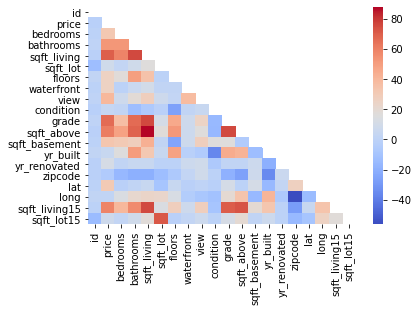

In [25]:
mask = np.triu(df.corr())
ax = sns.heatmap(round(df.corr()*100,0)
                ,annot=False, mask=mask, cmap='coolwarm')


Strong correlation between the "price" and "bathrooms", "sqft_living", "grade", "sqft_above" and "sqft_living15" 
Mean correlation between the "price" and "bedrooms", "view", "sqft_basement" and "lat"  
Caution! There ist strong correlation also between the features. They are not independent!

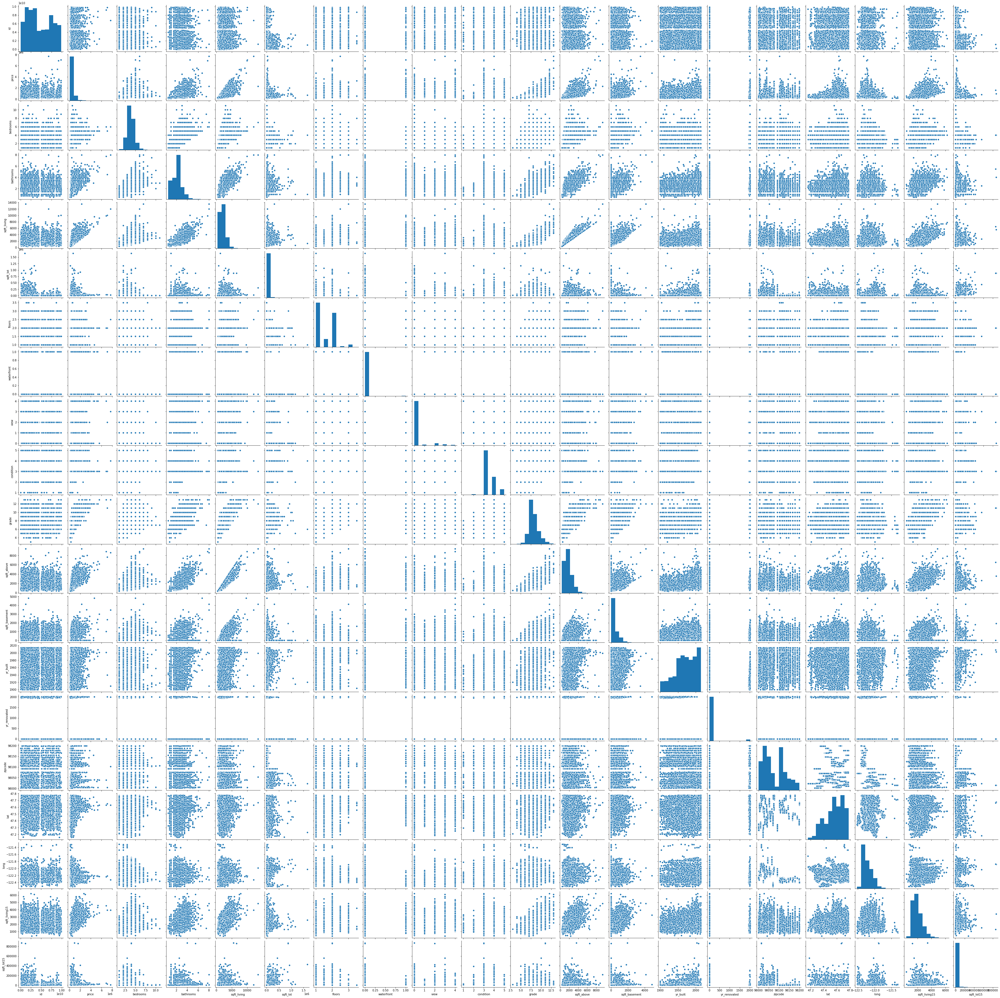

In [26]:
sns.pairplot(df);

### Boxplots and Histograms

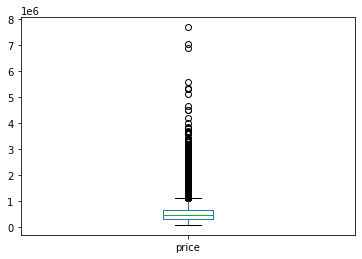

In [27]:
df.price.plot.box();

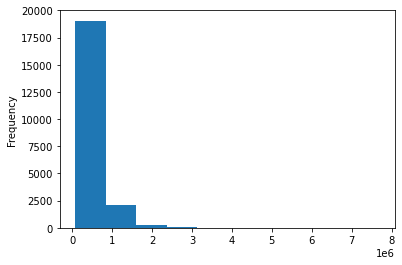

In [28]:
df.price.plot.hist();

The range of prices is not very large. 50% of the sales are in a small "price box". There are a number of upward outliers.

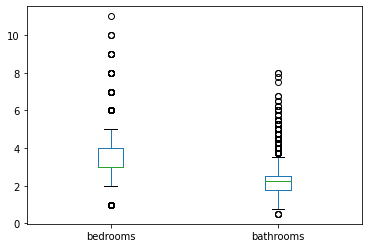

In [29]:
df[['bedrooms', 'bathrooms']].plot.box();

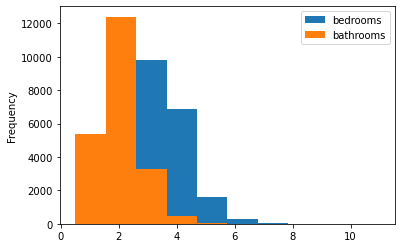

In [30]:
df[['bedrooms', 'bathrooms']].plot.hist();

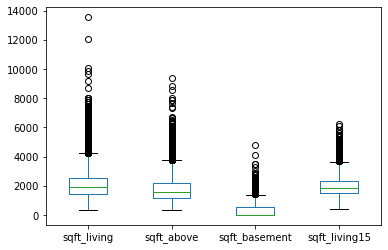

In [31]:
df[['sqft_living', 'sqft_above', 'sqft_basement', 'sqft_living15']].plot.box();

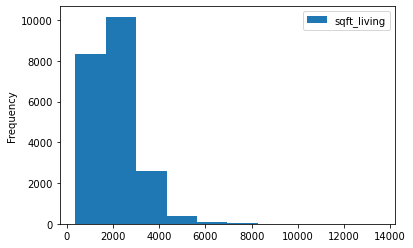

In [32]:
df[['sqft_living']].plot.hist();

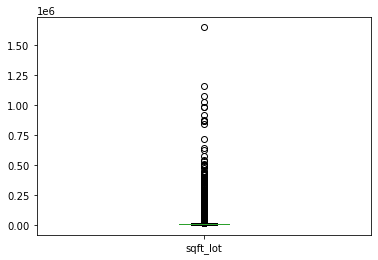

In [33]:
df[['sqft_lot']].plot.box();

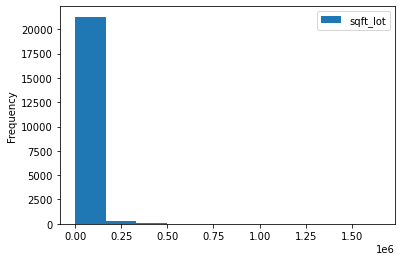

In [34]:
df[['sqft_lot']].plot.hist();

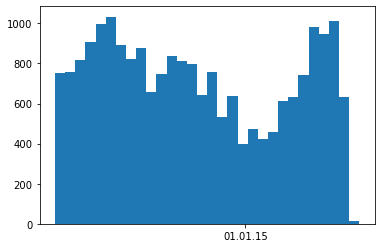

In [35]:
import matplotlib.dates as mdates
mpl_data = mdates.date2num(df.datetime)
fig, ax = plt.subplots(1,1)
ax.hist(mpl_data, bins=30)
ax.xaxis.set_major_locator(mdates.YearLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%d.%m.%y'))
plt.show()

It can be seen that fewer houses were sold in December and January. However, since the data only comes from one year, no general statements can be made about the course of sales over the years.

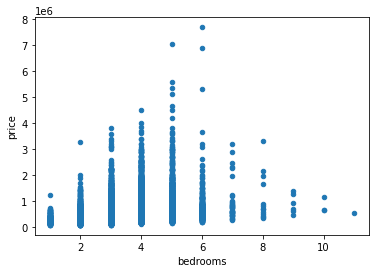

In [36]:
df.plot(x='bedrooms', y='price', kind='scatter');

A positive correlation can be seen up to a house size of 6 bedrooms.

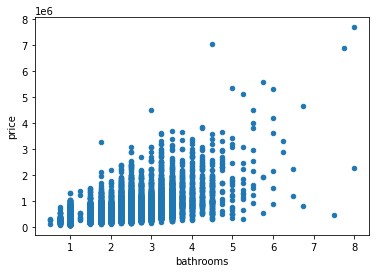

In [37]:
df.plot(x='bathrooms', y='price', kind='scatter');

A positive correlation can be seen.

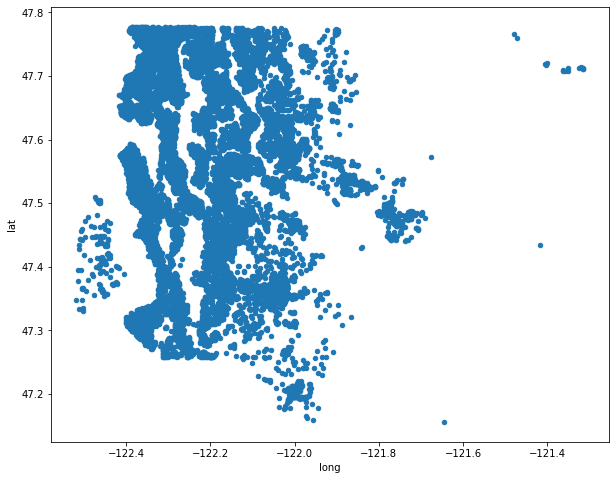

In [38]:
df.plot(x='long', y='lat', kind='scatter', figsize = (10,8), );

/Users/datascience/.conda/envs/nf/lib/python3.6/site-packages/pandas/plotting/_tools.py:307: MatplotlibDeprecationWarning:


The rowNum attribute was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use ax.get_subplotspec().rowspan.start instead.

/Users/datascience/.conda/envs/nf/lib/python3.6/site-packages/pandas/plotting/_tools.py:307: MatplotlibDeprecationWarning:


The colNum attribute was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use ax.get_subplotspec().colspan.start instead.

/Users/datascience/.conda/envs/nf/lib/python3.6/site-packages/pandas/plotting/_tools.py:313: MatplotlibDeprecationWarning:


The rowNum attribute was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use ax.get_subplotspec().rowspan.start instead.

/Users/datascience/.conda/envs/nf/lib/python3.6/site-packages/pandas/plotting/_tools.py:313: MatplotlibDeprecationWarning:


The colNum attribute was deprecated in Matplotlib 3.2

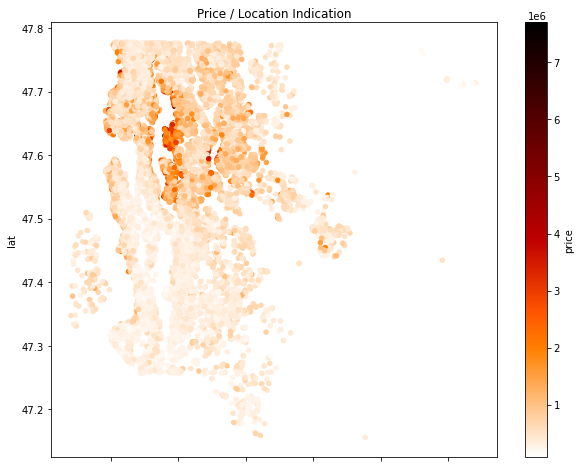

In [39]:

df.plot(kind="scatter", x="long", c="price", y="lat", figsize=(10, 8),
             cmap="gist_heat_r", colorbar=True, title="Price / Location Indication");
plt.show();

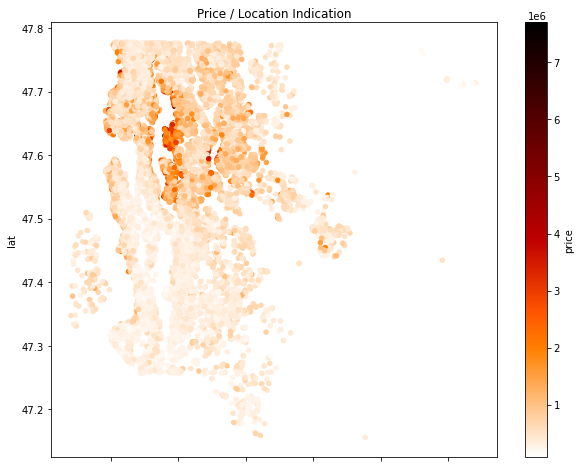

In [40]:
df.plot(kind="scatter", x="long", c="price", y="lat", figsize=(10, 8),
             cmap="gist_heat_r", colorbar=True, title="Price / Location Indication");
plt.show();

In [41]:
fig = px.density_mapbox(df, lat='lat', lon='long', z='price', radius=2,
                        center=dict(lat=47.5, lon=-122.2), zoom=8.2, opacity=1,
                        mapbox_style="open-street-map")
fig.show()

## 05 Feature Engineering

### Renovated
The feature provides information about whether the house has been renovated or not. 

In [43]:
yr_renovated_liste = df.yr_renovated.tolist()
reno = []
for elem in yr_renovated_liste:
    if elem == 0: 
         reno.append(elem)
    elif elem > 0:
        reno.append(1)
    else:
        reno.append(0)

df = df.assign(renovated = reno)
df.head().T
#cat_renovated = df['renovated'].astype('category')
#df = df.drop(['renovated'], axis=1)
#df = df.assign(renovated = cat_renovated)
#df.head().T
#df_dum = pd.get_dummies(df, drop_first=True)
#df_dum.head().T

,0,1,2,3,4
id,7129300520,6414100192,5631500400,2487200875,1954400510
price,221900,538000,180000,604000,510000
bedrooms,3,3,2,4,3
bathrooms,1,2.25,1,3,2
sqft_living,1180,2570,770,1960,1680
sqft_lot,5650,7242,10000,5000,8080
floors,1,2,1,1,1
waterfront,0,0,0,0,0
view,0,0,0,0,0
condition,3,3,3,5,3


###  price per sqft living space


In [44]:
price_liste = df.price.tolist()
sqft_living_liste = df.sqft_living.tolist()
price_per_living = []

for idx, val in enumerate(price_liste):
    price_per_living.append((val / sqft_living_liste[idx]))

df = df.assign(price_p_sqrt_liv = price_per_living)

### price per sqft land lot

In [45]:
price_liste = df.price.tolist()
sqft_lot_liste = df.sqft_lot.tolist()
price_per_lot = []

for idx, val in enumerate(price_liste):
    price_per_lot.append((val / sqft_lot_liste[idx]))

df = df.assign(price_p_sqrt_lot = price_per_lot)
df.head().T

,0,1,2,3,4
id,7129300520,6414100192,5631500400,2487200875,1954400510
price,221900,538000,180000,604000,510000
bedrooms,3,3,2,4,3
bathrooms,1,2.25,1,3,2
sqft_living,1180,2570,770,1960,1680
sqft_lot,5650,7242,10000,5000,8080
floors,1,2,1,1,1
waterfront,0,0,0,0,0
view,0,0,0,0,0
condition,3,3,3,5,3


### price per bedroom

In [46]:
price_liste = df.price.tolist()
bedrooms_liste = df.bedrooms.tolist()
price_per_bedroom = []

for idx, val in enumerate(price_liste):
    price_per_bedroom.append((val / bedrooms_liste[idx]))

df = df.assign(price_p_bedroom = price_per_bedroom)

,0,1,2,3,4
id,7129300520,6414100192,5631500400,2487200875,1954400510
price,221900,538000,180000,604000,510000
bedrooms,3,3,2,4,3
bathrooms,1,2.25,1,3,2
sqft_living,1180,2570,770,1960,1680
sqft_lot,5650,7242,10000,5000,8080
floors,1,2,1,1,1
waterfront,0,0,0,0,0
view,0,0,0,0,0
condition,3,3,3,5,3


### price per bathroom

In [47]:
price_liste = df.price.tolist()
bathrooms_liste = df.bathrooms.tolist()
price_per_bathroom = []

for idx, val in enumerate(price_liste):
    price_per_bathroom.append((val / bathrooms_liste[idx]))

df = df.assign(price_p_bathroom = price_per_bathroom)

,0,1,2,3,4
id,7129300520,6414100192,5631500400,2487200875,1954400510
price,221900,538000,180000,604000,510000
bedrooms,3,3,2,4,3
bathrooms,1,2.25,1,3,2
sqft_living,1180,2570,770,1960,1680
sqft_lot,5650,7242,10000,5000,8080
floors,1,2,1,1,1
waterfront,0,0,0,0,0
view,0,0,0,0,0
condition,3,3,3,5,3


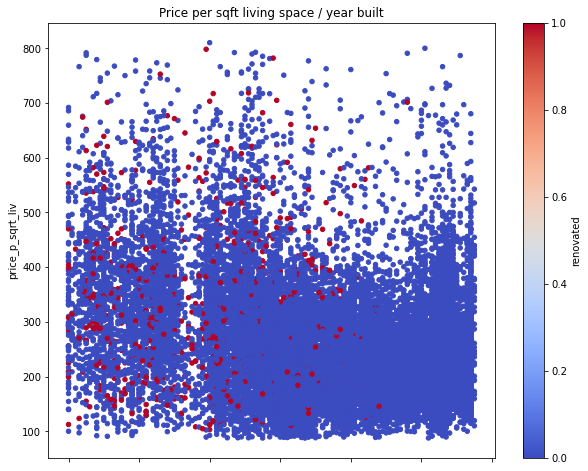

In [48]:
df.plot(kind="scatter", x="yr_built", c="renovated", y="price_p_sqrt_liv", figsize=(10, 8),
             cmap='coolwarm', colorbar=True, title="Price per sqft living space / year built");
plt.show();

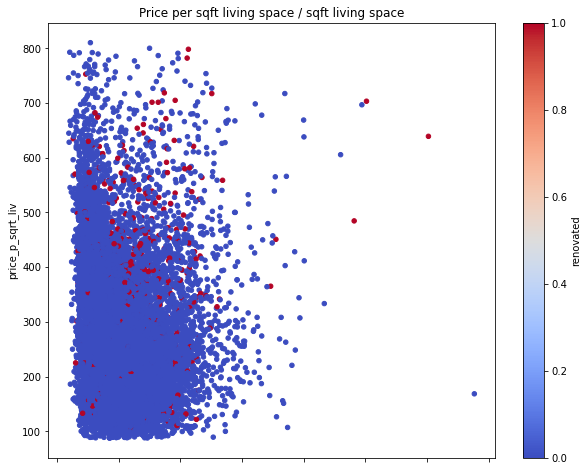

In [49]:
df.plot(kind="scatter", x="sqft_living", c="renovated", y="price_p_sqrt_liv", figsize=(10, 8),
             cmap='coolwarm', colorbar=True, title="Price per sqft living space / sqft living space");
plt.show();

The influence of a renovation can be seen clearly, also a negative correlation.

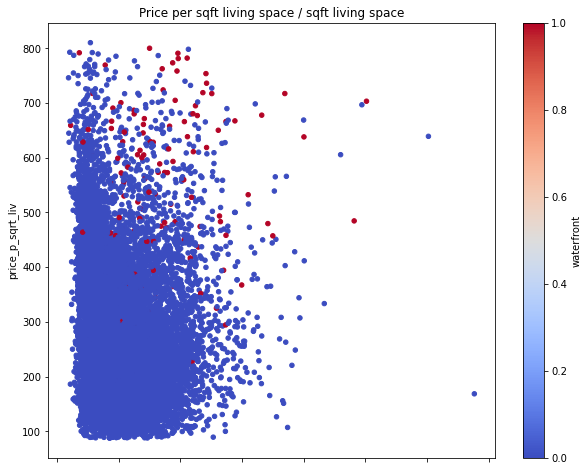

In [50]:
df.plot(kind="scatter", x="sqft_living", c="waterfront", y="price_p_sqrt_liv", figsize=(10, 8),
             cmap='coolwarm', colorbar=True, title="Price per sqft living space / sqft living space");
plt.show();

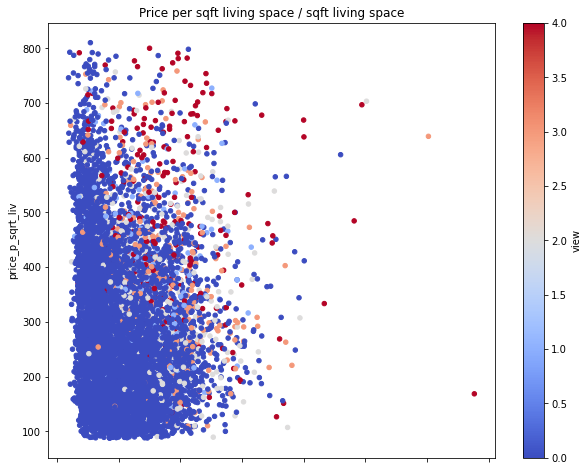

In [51]:
df.plot(kind="scatter", x="sqft_living", c="view", y="price_p_sqrt_liv", figsize=(10, 8),
             cmap='coolwarm', colorbar=True, title="Price per sqft living space / sqft living space");
plt.show();

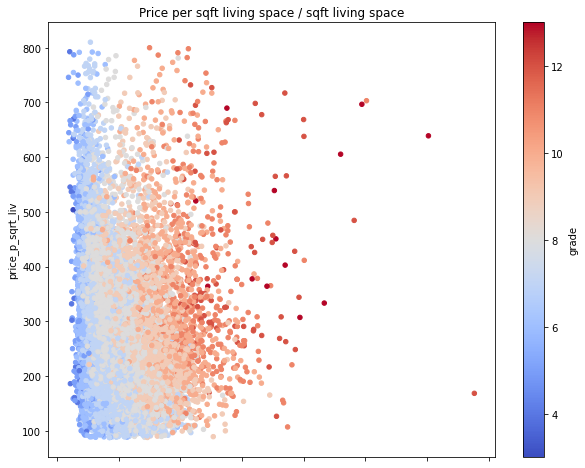

In [52]:
df.plot(kind="scatter", x="sqft_living", c="grade", y="price_p_sqrt_liv", figsize=(10, 8),
             cmap='coolwarm', colorbar=True, title="Price per sqft living space / sqft living space");
plt.show();

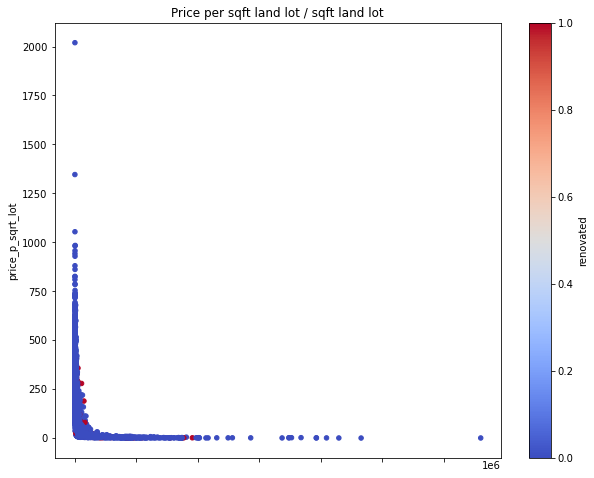

In [53]:
df.plot(kind="scatter", x="sqft_lot", c="renovated", y="price_p_sqrt_lot", figsize=(10, 8),
             cmap='coolwarm', colorbar=True, title="Price per sqft land lot / sqft land lot");
plt.show();

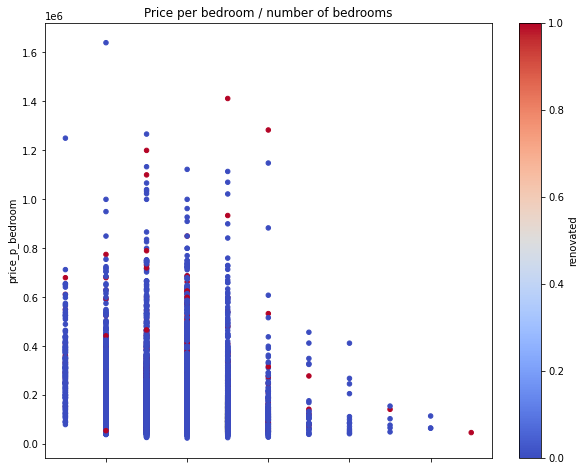

In [54]:
df.plot(kind="scatter", x="bedrooms", c="renovated", y="price_p_bedroom", figsize=(10, 8),
             cmap='coolwarm', colorbar=True, title="Price per bedroom / number of bedrooms");
plt.show();

A negative correlation can be seen also the influence of renovation.  
Proberties with only one bedroom are not included in this trend.

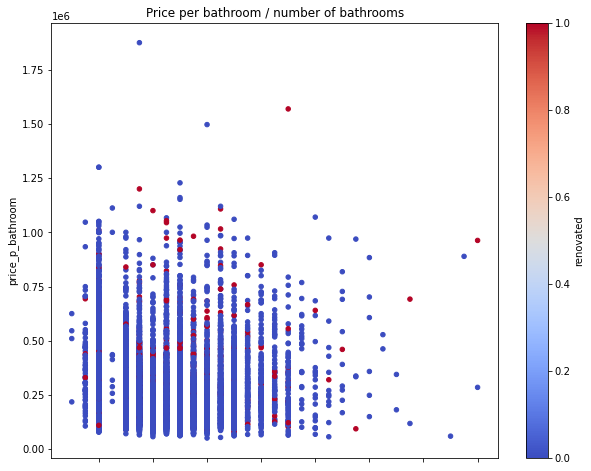

In [55]:
df.plot(kind="scatter", x="bathrooms", c="renovated", y="price_p_bathroom", figsize=(10, 8),
             cmap='coolwarm', colorbar=True, title="Price per bathroom / number of bathrooms");
plt.show();

A negative correlation can be seen also the influence of renovation.  
Proberties with less then one bathroom are not included in this trend.

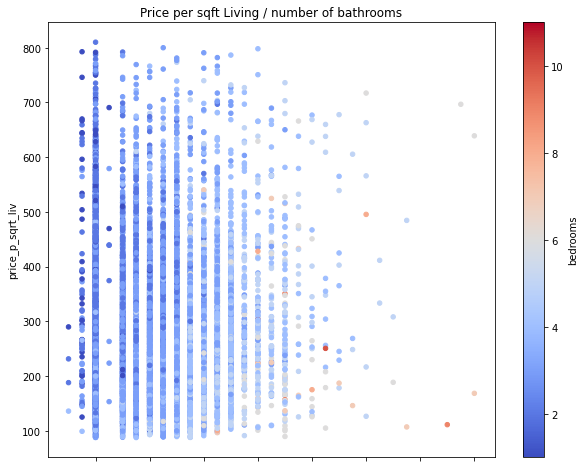

In [79]:
df.plot(kind="scatter", x="bathrooms", c="bedrooms", y="price_p_sqrt_liv", figsize=(10, 8),
             cmap='coolwarm', colorbar=True, title="Price per sqft Living / number of bathrooms");
plt.show();

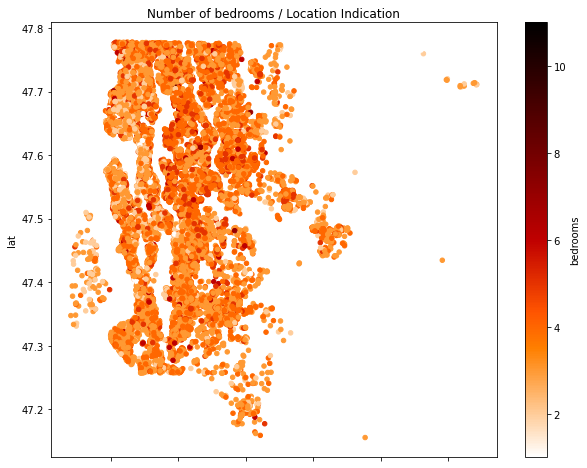

In [80]:
df.plot(kind="scatter", x="long", c="bedrooms", y="lat", figsize=(10, 8),
             cmap="gist_heat_r", colorbar=True, title="Number of bedrooms / Location Indication");
plt.show();

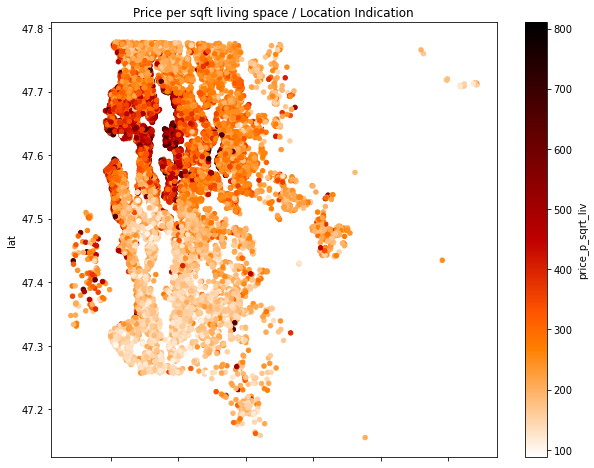

In [56]:
df.plot(kind="scatter", x="long", c="price_p_sqrt_liv", y="lat", figsize=(10, 8),
             cmap="gist_heat_r", colorbar=True, title="Price per sqft living space / Location Indication");
plt.show();

The price per squaremeter footage of the living space is highest in Seattle and there especially near lake washington.
In the south of the county the houses are cheaper then in the north. Prices per square meter are lower in the east than in the west.

In [81]:
fig = px.density_mapbox(df, lat='lat', lon='long', z='price', radius=2,
                        center=dict(lat=47.5, lon=-122.2), zoom=8.2, opacity=1,
                        mapbox_style="open-street-map")
fig.show()

In [82]:
fig = px.density_mapbox(df, lat='lat', lon='long', z='bedrooms', radius=2,
                        center=dict(lat=47.5, lon=-122.2), zoom=8.2, opacity=1,
                        mapbox_style="open-street-map")
fig.show()

## 06 Predictive Modeling 

### create a new Dataframe dfm with dummies for the categorial variables

In [57]:
dfm = df

In [58]:
view_dummies = pd.get_dummies(df.view, prefix="view", drop_first=True)
dfm = pd.concat([dfm, view_dummies] , axis=1)

In [59]:
condition_dummies = pd.get_dummies(df.condition, prefix="cond", drop_first=True)
dfm = pd.concat([dfm, condition_dummies] , axis=1)

In [60]:
grade_dummies = pd.get_dummies(df.grade, prefix="grade", drop_first=True)
dfm = pd.concat([dfm, grade_dummies] , axis=1)

In [61]:
zip_dummies = pd.get_dummies(df.zipcode, prefix="zip", drop_first=True)
dfm = pd.concat([dfm, zip_dummies] , axis=1)

In [62]:
dfm.head().T

,0,1,2,3,4
id,7129300520,6414100192,5631500400,2487200875,1954400510
price,221900,538000,180000,604000,510000
bedrooms,3,3,2,4,3
bathrooms,1,2.25,1,3,2
sqft_living,1180,2570,770,1960,1680
sqft_lot,5650,7242,10000,5000,8080
floors,1,2,1,1,1
waterfront,0,0,0,0,0
view,0,0,0,0,0
condition,3,3,3,5,3


In [63]:
X1 = dfm[['grade_4', 'grade_5', 'grade_6', 'grade_7', 'grade_8', 'grade_9', 'grade_10', 
         'grade_11', 'grade_12', 'grade_13']]
X1 = sm.add_constant(X1)
y = dfm.price
results1 = sm.OLS(y,X1, missing='drop').fit()
results1.summary()

/Users/datascience/.conda/envs/nf/lib/python3.6/site-packages/numpy/core/fromnumeric.py:2389: FutureWarning:

Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.



<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.520
Model:                            OLS   Adj. R-squared:                  0.520
Method:                 Least Squares   F-statistic:                     2338.
Date:                Thu, 17 Sep 2020   Prob (F-statistic):               0.00
Time:                        08:45:44   Log-Likelihood:            -2.9947e+05
No. Observations:               21597   AIC:                         5.990e+05
Df Residuals:                   21586   BIC:                         5.990e+05
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        2.62e+05   2.55e+05      1.029      0.303   -2.37e+05    7.61e+05
grade_4        -5e+04   2.59e+05     -0.193      0.847   -5.58e+05    4.58e+05
grade_5    -1.348e+04   2.55e+05     -0.053      0.958   -5.14e+05    4.87e+05
grade_6     3.992e+04   2.55e+05      0.157      0.875   -4.59e+05    5.39e+05
grade_7     1.406e+05   2.55e+05      0.552      0.581   -3.58e+05     6.4e+05
grade_8      2.81e+05   2.55e+05      1.104      0.270   -2.18e+05     7.8e+05
grade_9     5.117e+05   2.55e+05      2.010      0.044    1.26e+04    1.01e+06
grade_10    8.103e+05   2.55e+05      3.182      0.001    3.11e+05    1.31e+06
grade_11    1.236e+06   2.55e+05      4.848      0.000    7.36e+05    1.74e+06
grade_12    1.941e+06   2.56e+05      7.580      0.000    1.44e+06    2.44e+06
grade_13    3.449e+06   2.64e+05     13.054      0.000    2.93e+06    3.97e+06
==============================================================================
Omnibus:                    15768.954   Durbin-Watson:                   1.982
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           792638.204
Skew:                           2.994   Prob(JB):                         0.00
Kurtosis:                      32.068   Cond. No.                         555.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [64]:
X2 = dfm.sqft_living
X2 = sm.add_constant(X2)
y = dfm.price
results2 = sm.OLS(y,X2, missing='drop').fit()
results2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.493
Model:                            OLS   Adj. R-squared:                  0.493
Method:                 Least Squares   F-statistic:                 2.097e+04
Date:                Thu, 17 Sep 2020   Prob (F-statistic):               0.00
Time:                        08:45:44   Log-Likelihood:            -3.0006e+05
No. Observations:               21597   AIC:                         6.001e+05
Df Residuals:                   21595   BIC:                         6.001e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const       -4.399e+04   4410.023     -9.975      0.000   -5.26e+04   -3.53e+04
sqft_living   280.8630      1.939    144.819      0.000     277.062     284.664
==============================================================================
Omnibus:                    14801.942   Durbin-Watson:                   1.982
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           542662.604
Skew:                           2.820   Prob(JB):                         0.00
Kurtosis:                      26.901   Cond. No.                     5.63e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.63e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [65]:
X3 = dfm[['sqft_living','cond_2', 'cond_3','cond_4','cond_5']]
X3 = sm.add_constant(X3)
y = dfm.price
results3 = sm.OLS(y,X3, missing='drop').fit()
results3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.499
Model:                            OLS   Adj. R-squared:                  0.499
Method:                 Least Squares   F-statistic:                     4307.
Date:                Thu, 17 Sep 2020   Prob (F-statistic):               0.00
Time:                        08:45:44   Log-Likelihood:            -2.9992e+05
No. Observations:               21597   AIC:                         5.999e+05
Df Residuals:                   21591   BIC:                         5.999e+05
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const       -1.193e+04   4.83e+04     -0.247      0.805   -1.07e+05    8.28e+04
sqft_living   282.8679      1.941    145.756      0.000     279.064     286.672
cond_2      -6.179e+04   5.22e+04     -1.183      0.237   -1.64e+05    4.06e+04
cond_3      -5.384e+04   4.84e+04     -1.113      0.266   -1.49e+05    4.09e+04
cond_4      -1.868e+04   4.84e+04     -0.386      0.700   -1.14e+05    7.62e+04
cond_5       5.229e+04   4.87e+04      1.074      0.283   -4.32e+04    1.48e+05
==============================================================================
Omnibus:                    14845.154   Durbin-Watson:                   1.984
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           556085.012
Skew:                           2.825   Prob(JB):                         0.00
Kurtosis:                      27.208   Cond. No.                     1.39e+05
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.39e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [66]:
X4 = dfm[['sqft_living', 'view_1.0', 'view_2.0', 'view_3.0', 'view_4.0']]
X4 = sm.add_constant(X4)
y = dfm.price
results4 = sm.OLS(y,X4, missing='drop').fit()
results4.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.543
Model:                            OLS   Adj. R-squared:                  0.543
Method:                 Least Squares   F-statistic:                     5126.
Date:                Thu, 17 Sep 2020   Prob (F-statistic):               0.00
Time:                        08:45:44   Log-Likelihood:            -2.9894e+05
No. Observations:               21597   AIC:                         5.979e+05
Df Residuals:                   21591   BIC:                         5.979e+05
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const       -1.567e+04   4231.324     -3.703      0.000    -2.4e+04   -7376.933
sqft_living   256.5464      1.920    133.605      0.000     252.783     260.310
view_1.0     1.695e+05   1.38e+04     12.248      0.000    1.42e+05    1.97e+05
view_2.0      1.27e+05   8320.469     15.267      0.000    1.11e+05    1.43e+05
view_3.0      2.15e+05   1.13e+04     18.967      0.000    1.93e+05    2.37e+05
view_4.0     6.127e+05   1.43e+04     42.849      0.000    5.85e+05    6.41e+05
==============================================================================
Omnibus:                    14059.068   Durbin-Watson:                   1.979
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           568330.087
Skew:                           2.573   Prob(JB):                         0.00
Kurtosis:                      27.599   Cond. No.                     1.94e+04
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.94e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [67]:
X5 = dfm[['sqft_living', 'view_1.0', 'view_2.0', 'view_3.0', 'view_4.0', 'renovated' ]]
X5 = sm.add_constant(X5)
y = dfm.price
results5 = sm.OLS(y,X5, missing='drop').fit()
results5.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.547
Model:                            OLS   Adj. R-squared:                  0.547
Method:                 Least Squares   F-statistic:                     4342.
Date:                Thu, 17 Sep 2020   Prob (F-statistic):               0.00
Time:                        08:45:44   Log-Likelihood:            -2.9884e+05
No. Observations:               21597   AIC:                         5.977e+05
Df Residuals:                   21590   BIC:                         5.978e+05
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const       -1.811e+04   4216.171     -4.296      0.000   -2.64e+04   -9846.867
sqft_living   255.8567      1.912    133.795      0.000     252.108     259.605
view_1.0     1.639e+05   1.38e+04     11.893      0.000    1.37e+05    1.91e+05
view_2.0     1.244e+05   8285.643     15.015      0.000    1.08e+05    1.41e+05
view_3.0     2.071e+05   1.13e+04     18.324      0.000    1.85e+05    2.29e+05
view_4.0     5.999e+05   1.43e+04     42.055      0.000    5.72e+05    6.28e+05
renovated    1.292e+05   9273.835     13.931      0.000    1.11e+05    1.47e+05
==============================================================================
Omnibus:                    13937.537   Durbin-Watson:                   1.979
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           547094.915
Skew:                           2.549   Prob(JB):                         0.00
Kurtosis:                      27.124   Cond. No.                     1.95e+04
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.95e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [68]:
X6 = dfm[['sqft_living', 'view_1.0', 'view_2.0', 'view_3.0', 'view_4.0', 'grade_4', 'grade_5', 'grade_6', 'grade_7', 'grade_8', 'grade_9', 'grade_10', 
         'grade_11', 'grade_12', 'grade_13' ]]
X6 = sm.add_constant(X6)
y = dfm.price
results6 = sm.OLS(y,X6, missing='drop').fit()
results6.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.620
Model:                            OLS   Adj. R-squared:                  0.620
Method:                 Least Squares   F-statistic:                     2349.
Date:                Thu, 17 Sep 2020   Prob (F-statistic):               0.00
Time:                        08:45:45   Log-Likelihood:            -2.9694e+05
No. Observations:               21597   AIC:                         5.939e+05
Df Residuals:                   21581   BIC:                         5.940e+05
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const        1.879e+05   2.27e+05      0.830      0.407   -2.56e+05    6.32e+05
sqft_living   142.4756      2.676     53.235      0.000     137.230     147.721
view_1.0      1.74e+05   1.26e+04     13.790      0.000    1.49e+05    1.99e+05
view_2.0     1.098e+05   7595.449     14.453      0.000    9.49e+04    1.25e+05
view_3.0     1.844e+05   1.04e+04     17.813      0.000    1.64e+05    2.05e+05
view_4.0     5.358e+05   1.31e+04     40.856      0.000     5.1e+05    5.62e+05
grade_4     -8.986e+04   2.31e+05     -0.390      0.697   -5.42e+05    3.62e+05
grade_5     -9.327e+04   2.27e+05     -0.411      0.681   -5.38e+05    3.52e+05
grade_6     -6.373e+04   2.27e+05     -0.281      0.778   -5.08e+05     3.8e+05
grade_7     -3.401e+04   2.27e+05     -0.150      0.881   -4.78e+05     4.1e+05
grade_8      2.381e+04   2.27e+05      0.105      0.916    -4.2e+05    4.68e+05
grade_9      1.411e+05   2.27e+05      0.623      0.534   -3.03e+05    5.85e+05
grade_10      3.25e+05   2.27e+05      1.433      0.152   -1.19e+05    7.69e+05
grade_11     5.934e+05   2.27e+05      2.614      0.009    1.48e+05    1.04e+06
grade_12     1.067e+06   2.28e+05      4.676      0.000     6.2e+05    1.51e+06
grade_13     2.279e+06   2.36e+05      9.667      0.000    1.82e+06    2.74e+06
==============================================================================
Omnibus:                    13158.076   Durbin-Watson:                   1.982
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           505159.093
Skew:                           2.343   Prob(JB):                         0.00
Kurtosis:                      26.225   Cond. No.                     1.11e+06
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.11e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [69]:
X7 = dfm[['sqft_living',  'grade_4', 'grade_5', 'grade_6', 'grade_7', 'grade_8', 'grade_9', 'grade_10', 
         'grade_11', 'grade_12', 'grade_13' , 'lat']]
X7 = sm.add_constant(X7)
y = dfm.price
results7 = sm.OLS(y,X7, missing='drop').fit()
results7.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.644
Model:                            OLS   Adj. R-squared:                  0.644
Method:                 Least Squares   F-statistic:                     3259.
Date:                Thu, 17 Sep 2020   Prob (F-statistic):               0.00
Time:                        08:45:45   Log-Likelihood:            -2.9623e+05
No. Observations:               21597   AIC:                         5.925e+05
Df Residuals:                   21584   BIC:                         5.926e+05
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const       -3.139e+07   5.57e+05    -56.331      0.000   -3.25e+07   -3.03e+07
sqft_living   165.2569      2.570     64.306      0.000     160.220     170.294
grade_4     -2.691e+05   2.23e+05     -1.206      0.228   -7.07e+05    1.68e+05
grade_5     -2.848e+05    2.2e+05     -1.297      0.195   -7.15e+05    1.46e+05
grade_6     -2.883e+05   2.19e+05     -1.315      0.188   -7.18e+05    1.41e+05
grade_7     -2.835e+05   2.19e+05     -1.293      0.196   -7.13e+05    1.46e+05
grade_8     -2.333e+05   2.19e+05     -1.064      0.287   -6.63e+05    1.96e+05
grade_9     -1.221e+05   2.19e+05     -0.557      0.578   -5.52e+05    3.08e+05
grade_10     5.865e+04   2.19e+05      0.267      0.789   -3.71e+05    4.89e+05
grade_11     3.335e+05    2.2e+05      1.518      0.129   -9.71e+04    7.64e+05
grade_12     8.613e+05   2.21e+05      3.901      0.000    4.29e+05    1.29e+06
grade_13     2.013e+06   2.28e+05      8.823      0.000    1.57e+06    2.46e+06
lat          6.687e+05   1.09e+04     61.619      0.000    6.47e+05     6.9e+05
==============================================================================
Omnibus:                    16050.171   Durbin-Watson:                   1.995
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           806762.159
Skew:                           3.080   Prob(JB):                         0.00
Kurtosis:                      32.302   Cond. No.                     1.15e+06
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.15e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [70]:
X8 = dfm[['sqft_living', 'view_1.0', 'view_2.0', 'view_3.0', 'view_4.0' , 'waterfront', 'lat', 'long']]
X8 = sm.add_constant(X8)
y = dfm.price
results8 = sm.OLS(y,X8, missing='drop').fit()
results8.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.633
Model:                            OLS   Adj. R-squared:                  0.633
Method:                 Least Squares   F-statistic:                     4651.
Date:                Thu, 17 Sep 2020   Prob (F-statistic):               0.00
Time:                        08:45:45   Log-Likelihood:            -2.9657e+05
No. Observations:               21597   AIC:                         5.932e+05
Df Residuals:                   21588   BIC:                         5.932e+05
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const       -5.905e+07   1.41e+06    -41.838      0.000   -6.18e+07   -5.63e+07
sqft_living   260.3352      1.799    144.704      0.000     256.809     263.862
view_1.0     1.356e+05   1.25e+04     10.890      0.000    1.11e+05     1.6e+05
view_2.0     1.116e+05   7488.334     14.903      0.000    9.69e+04    1.26e+05
view_3.0     1.966e+05   1.02e+04     19.233      0.000    1.77e+05    2.17e+05
view_4.0     3.676e+05   1.56e+04     23.637      0.000    3.37e+05    3.98e+05
waterfront   5.603e+05   2.25e+04     24.879      0.000    5.16e+05    6.04e+05
lat          6.934e+05   1.11e+04     62.517      0.000    6.72e+05    7.15e+05
long        -2.132e+05   1.14e+04    -18.703      0.000   -2.35e+05   -1.91e+05
==============================================================================
Omnibus:                    15718.304   Durbin-Watson:                   1.990
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           893450.024
Skew:                           2.936   Prob(JB):                         0.00
Kurtosis:                      33.958   Cond. No.                     2.12e+06
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.12e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [71]:
X9 = dfm[['sqft_living', 'grade_4', 'grade_5', 'grade_6', 'grade_7', 'grade_8', 'grade_9', 'grade_10', 
         'grade_11', 'grade_12', 'grade_13', 'bathrooms']]
X9 = sm.add_constant(X9)
y = dfm.price
results9 = sm.OLS(y,X9, missing='drop').fit()
results9.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.582
Model:                            OLS   Adj. R-squared:                  0.582
Method:                 Least Squares   F-statistic:                     2505.
Date:                Thu, 17 Sep 2020   Prob (F-statistic):               0.00
Time:                        08:45:45   Log-Likelihood:            -2.9797e+05
No. Observations:               21597   AIC:                         5.960e+05
Df Residuals:                   21584   BIC:                         5.961e+05
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const        1.863e+05   2.38e+05      0.784      0.433   -2.79e+05    6.52e+05
sqft_living   163.9114      3.297     49.715      0.000     157.449     170.374
grade_4     -7.435e+04   2.42e+05     -0.307      0.759   -5.49e+05       4e+05
grade_5     -8.481e+04   2.38e+05     -0.356      0.722   -5.51e+05    3.82e+05
grade_6      -6.39e+04   2.38e+05     -0.269      0.788    -5.3e+05    4.02e+05
grade_7      -3.74e+04   2.38e+05     -0.157      0.875   -5.03e+05    4.28e+05
grade_8       2.84e+04   2.38e+05      0.120      0.905   -4.37e+05    4.94e+05
grade_9      1.511e+05   2.38e+05      0.636      0.525   -3.15e+05    6.17e+05
grade_10     3.472e+05   2.38e+05      1.460      0.144   -1.19e+05    8.13e+05
grade_11     6.355e+05   2.38e+05      2.669      0.008    1.69e+05     1.1e+06
grade_12     1.169e+06   2.39e+05      4.886      0.000       7e+05    1.64e+06
grade_13     2.363e+06   2.47e+05      9.554      0.000    1.88e+06    2.85e+06
bathrooms   -1.269e+04   3369.505     -3.766      0.000   -1.93e+04   -6086.480
==============================================================================
Omnibus:                    13841.973   Durbin-Watson:                   1.988
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           470911.424
Skew:                           2.571   Prob(JB):                         0.00
Kurtosis:                      25.291   Cond. No.                     1.11e+06
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.11e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

### Example Prediction  - Model 7###
**Example 1:** large house in a prime grade and location  
sqft_living = 2500.  
grade = 13  
lat = 476

**Example 2 :** small house in a less good location and grade  
sqft_living = 1500.  
grade = 4  
lat = 472

In [75]:
print('price example 1: ', results7.predict(np.array([[1, 2500, 0,0,0,0,0,0,0,0,0,1,476]])))
print('price example 2: ', results7.predict(np.array([[1, 1500, 1,0,0,0,0,0,0,0,0,0,472]])))
print('median price: ', df.price.median())

price example 1:  [2.89328261e+08]
price example 2:  [2.84205991e+08]
median price:  450000.0


### Example Prediction  - Model 8###
**Example 1:** large house in a location  
sqft_living = 2500.  
waterfront = 1    
view = 4  
lat = 476  
long = - 122.0  

**Example 2 :** small house in a less good location   
sqft_living = 1500.  
waterfront = 0    
view = 1     
lat = 472    
long = -122.25

In [77]:
print('price example 1: ', results8.predict(np.array([[1, 2500,0,0,0,1,1,476, -122.0]])))
print('price example 2: ', results8.predict(np.array([[1, 1500,1,0,0,0,0,472, -122.25]])))
print('median price: ', df.price.median())

price example 1:  [2.98607497e+08]
price example 2:  [2.94834445e+08]
median price:  450000.0


**Not good at all!** The predicted price is way too high!!!

## 07 Data Visualization